In [1]:
import numpy as np
from astropy.io import votable
from image_stack import ImageStack

%matplotlib inline 
from matplotlib import pyplot as plt

In [2]:
"""
colourblind-safe colours
"""
COLORS = (
    '#000000',
    '#0072b2',
    '#56b4e9',
    '#009e73',
    '#cc79a7',
    '#d55e00',
    '#e69f00',
    '#f0e442')

cm = plt.get_cmap('cubehelix')
print cm(0.5)

(0.6328422475018423, 0.4747981096220677, 0.29070209208025455, 1.0)


In [3]:
FREQ="121-132"
TABLE_NAME = 'cme_nocme_apparent.vot'

In [4]:
tab = votable.parse_single_table(TABLE_NAME)
OBSID1=tab.params[0].value
OBSID2=tab.params[1].value
print tab.fields

[<FIELD ID="Source_name_tgss" arraysize="*" datatype="char" name="source_name_tgss"/>, <FIELD ID="ra" datatype="double" name="ra_scint_1"/>, <FIELD ID="dec" datatype="double" name="dec_scint_1"/>, <FIELD ID="elongation" datatype="double" name="elongation_1" unit="deg"/>, <FIELD ID="nsi_1" datatype="double" name="nsi_1"/>, <FIELD ID="err_nsi_1" datatype="double" name="err_nsi_1"/>, <FIELD ID="ra_2" datatype="double" name="ra_scint_2"/>, <FIELD ID="dec_2" datatype="double" name="dec_scint_2"/>, <FIELD ID="elongation_2" datatype="double" name="elongation_2" unit="deg"/>, <FIELD ID="nsi_2" datatype="double" name="nsi_2"/>, <FIELD ID="err_nsi_2" datatype="double" name="err_nsi_2"/>]


In [5]:
imstack1 = ImageStack("../%d.hdf5" % OBSID1, freq=FREQ)
imstack2 = ImageStack("../%d.hdf5" % OBSID2, freq=FREQ)

In [6]:
ra1 = tab.to_table()[tab.get_field_by_id_or_name('ra_scint_1').ID]
de1 = tab.to_table()[tab.get_field_by_id_or_name('dec_scint_1').ID]
ra2 = tab.to_table()[tab.get_field_by_id_or_name('ra_scint_2').ID]
de2 = tab.to_table()[tab.get_field_by_id_or_name('dec_scint_2').ID]
nsi1 = tab.to_table()[tab.get_field_by_id_or_name('nsi_1').ID]
nsi2 = tab.to_table()[tab.get_field_by_id_or_name('nsi_2').ID]
snr1 = nsi1 / tab.to_table()[tab.get_field_by_id_or_name('err_nsi_1').ID]
snr2 = nsi2 / tab.to_table()[tab.get_field_by_id_or_name('err_nsi_2').ID]
name = tab.to_table()[tab.get_field_by_id_or_name('Source_name_tgss').ID]

In [7]:
#print tab['peak_flux']/tab['local_rms']
b = np.argsort(-(np.hypot(snr1.data, snr2.data))) # brightest first
print b[:10]
print len(b)
            

[170 106 111 244  65  66 208  26   8  88]
256


In [8]:
t = imstack1.get_intervals()
print imstack1.wcs.printwcs()
print imstack2.wcs.printwcs()

WCS Keywords

Number of WCS axes: 4
CTYPE : 'RA---SIN'  'DEC--SIN'  'FREQ'  'STOKES'  
CRVAL : -1.196135  -26.78504  161900000.0  -5.0  
CRPIX : 2382.561  -843.6235  1.0  1.0  
PC1_1 PC1_2 PC1_3 PC1_4  : 1.0  0.0  0.0  0.0  
PC2_1 PC2_2 PC2_3 PC2_4  : 0.0  1.0  0.0  0.0  
PC3_1 PC3_2 PC3_3 PC3_4  : 0.0  0.0  1.0  0.0  
PC4_1 PC4_2 PC4_3 PC4_4  : 0.0  0.0  0.0  1.0  
CDELT : -0.01666667  0.01666667  15360000.0  1.0  
NAXIS : 2400  2400  1  1
None
WCS Keywords

Number of WCS axes: 4
CTYPE : 'RA---SIN'  'DEC--SIN'  'FREQ'  'STOKES'  
CRVAL : -1.246819  -26.7851  161900000.0  -5.0  
CRPIX : 2382.566  -843.623  1.0  1.0  
PC1_1 PC1_2 PC1_3 PC1_4  : 1.0  0.0  0.0  0.0  
PC2_1 PC2_2 PC2_3 PC2_4  : 0.0  1.0  0.0  0.0  
PC3_1 PC3_2 PC3_3 PC3_4  : 0.0  0.0  1.0  0.0  
PC4_1 PC4_2 PC4_3 PC4_4  : 0.0  0.0  0.0  1.0  
CDELT : -0.01666667  0.01666667  15360000.0  1.0  
NAXIS : 2400  2400  1  1
None


In [16]:
N=len(b)
ts1 = []
ts_noise1 = []
ts2 = []
ts_noise2 = []
offset = 5

for i in range(N):
    x, y = imstack1.world2pix(ra1[b[i]], de1[b[i]] )
    #print x, y
    ts1.append(imstack1.pix2ts(x, y))
    ts_noise1.append([imstack1.pix2ts(x+j, y+k) 
                      for j, k in ((offset, offset,), (offset, -offset), (-offset, offset), (-offset, -offset))])
    
    x, y = imstack2.world2pix(ra2[b[i]], de2[b[i]] )
    #print x, y
    ts2.append(imstack2.pix2ts(x, y))
    ts_noise2.append([imstack2.pix2ts(x+j, y+k)
                      for j, k in ((offset, offset,), (offset, -offset), (-offset, offset), (-offset, -offset))])

In [17]:
print len(ts1[0])
print sum(ts1[0]>1)
#print ts1[0][8:-8]
print len(ts1[0][8:-7])
print 576 % 32
s = slice(8, -7)
#print ts_noise1[0][0][s]

591
577
576
0


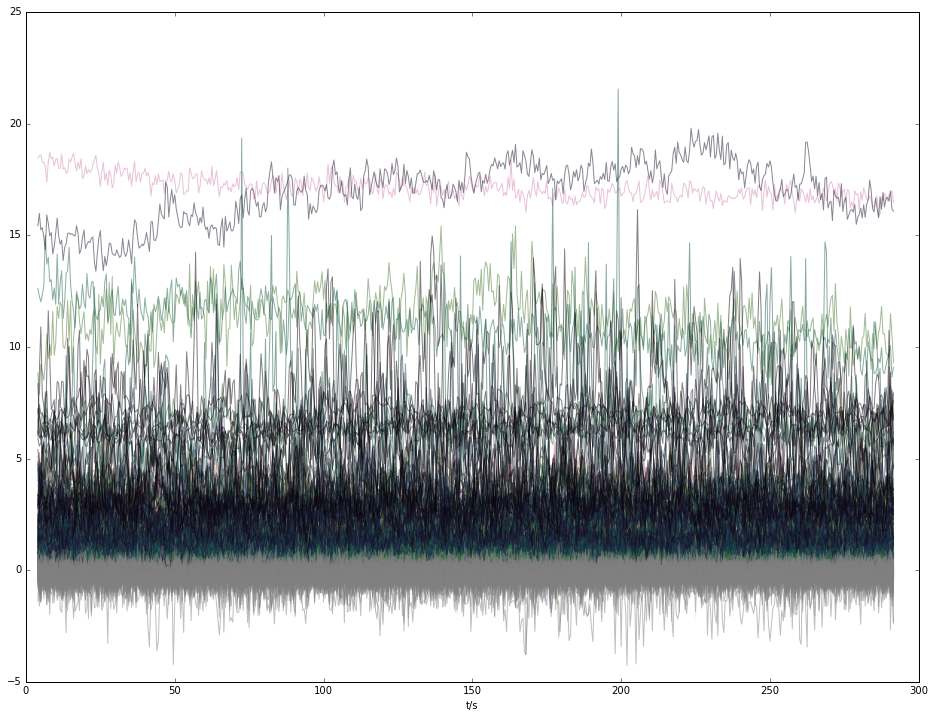

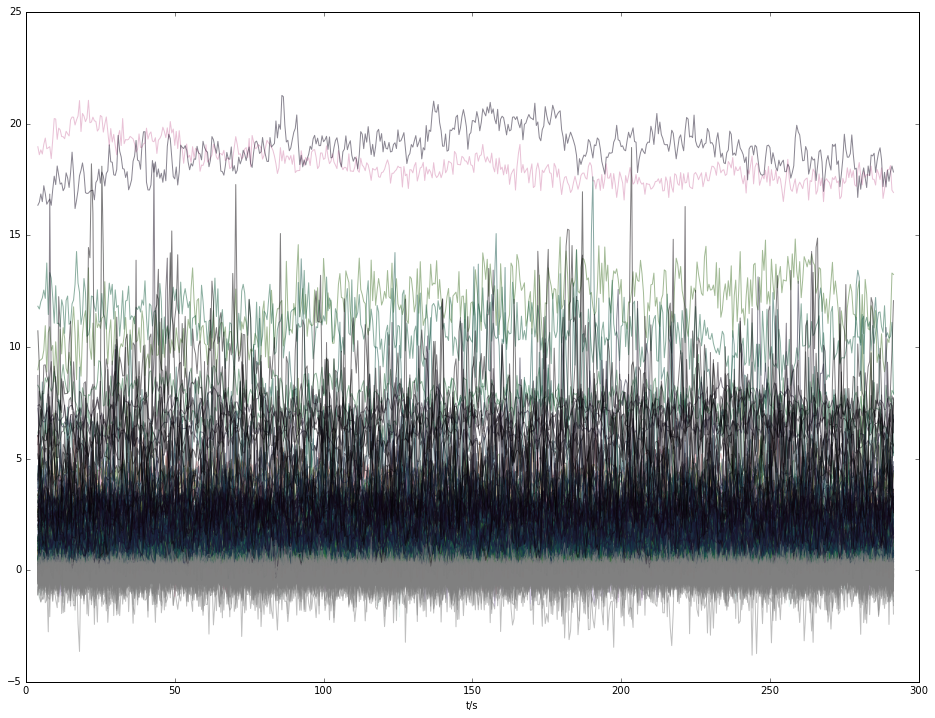

In [21]:
plt.figure(figsize=(16.0, 12.0))

for i in range(N):
    plt.plot(t[s], ts1[N-1-i][s], color=cm(1-float(i)/N), alpha=0.5)
    plt.plot(t[s], ts_noise1[N-1-i][0][s], color='grey', alpha=0.5)
plt.xlabel("t/s")

plt.figure(figsize=(16.0, 12.0))

for i in range(N):
    plt.plot(t[s], ts2[N-1-i][s], color=cm(1-float(i)/N), alpha=0.5)
    plt.plot(t[s], ts_noise2[N-1-i][0][s], color='grey', alpha=0.5)
plt.xlabel("t/s")



In [22]:
from scipy.signal import hann, welch
from scipy.stats import chi2


50
[[1.1170503935162315], [0.9223217249217673]]
[[1.438259061498186], [0.7406879977251016]]


/usr/local/lib/python2.7/dist-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


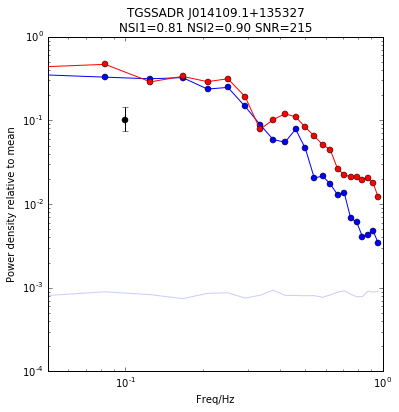

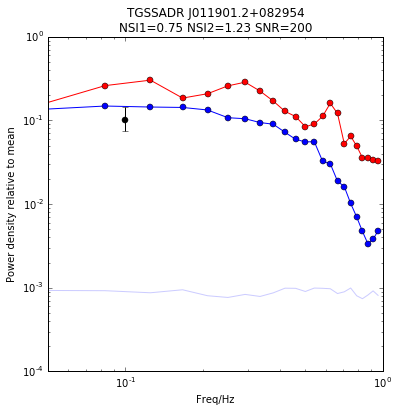

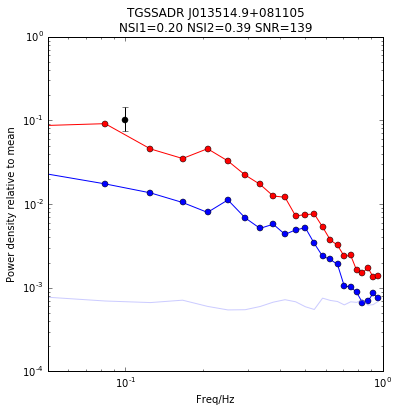

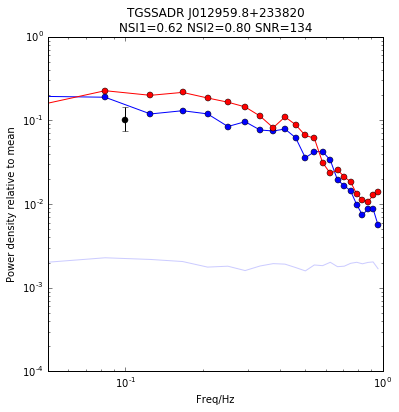

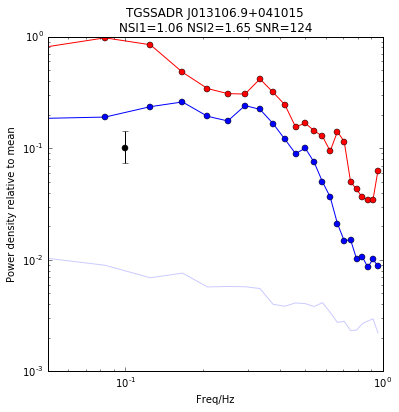

...

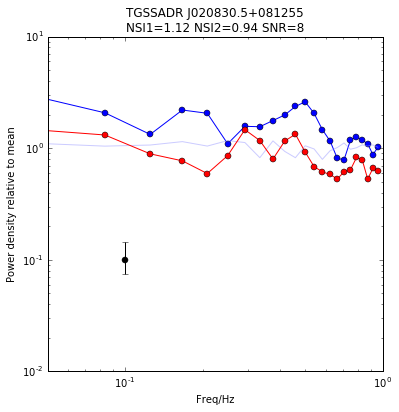

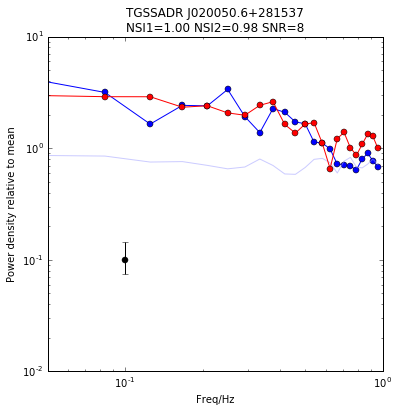

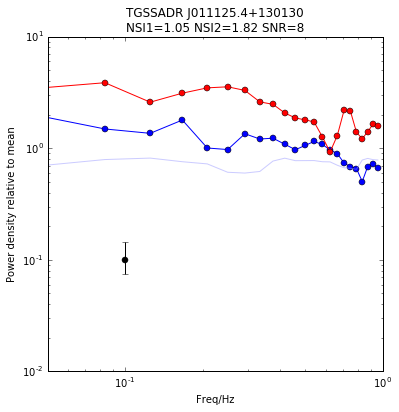

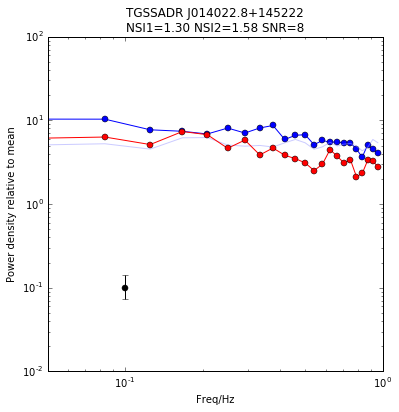

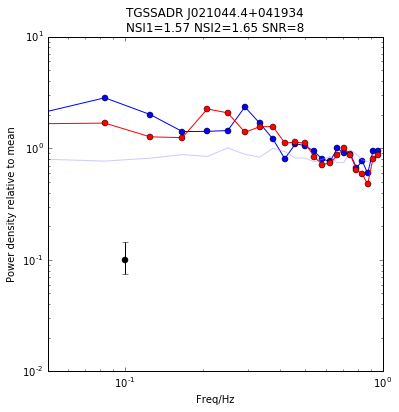

In [25]:
ts1[0][8:-7]
n=len(ts1[0][s])
FFT_WINDOW=48
n_dof = 2*(2*n//FFT_WINDOW+1)
print n_dof
print [[n_dof/chi2.ppf(0.317, n_dof)], [n_dof/chi2.ppf(0.683, n_dof)]]
print [[n_dof/chi2.ppf(0.05, n_dof)], [n_dof/chi2.ppf(0.95, n_dof)]]

for i in range(N):
    plt.figure(figsize=(6.0, 6.0))
    f, ps_on = welch(ts1[i][s]/np.mean(ts1[i][s]), fs=2., window='hanning', nperseg=FFT_WINDOW, detrend='constant')
    ps_noise = sum([welch(ts_noise1[i][j][s]/np.mean(ts1[i][s]), fs=2., window='hanning', nperseg=FFT_WINDOW, detrend='constant')[1] 
                       for j in range(4)])/4.0
    plt.loglog(f[:-1], ps_on[:-1], 'o-', color='blue',)
    plt.loglog(f[:-1], ps_noise[:-1], color='#9999FF', alpha=0.5)

    _, ps_on = welch(ts2[i][s]/np.mean(ts2[i][s]), fs=2., window='hanning', nperseg=FFT_WINDOW, detrend='constant')
    ps_noise = sum([welch(ts_noise2[i][j][s]/np.mean(ts2[i][s]), fs=2., window='hanning', nperseg=FFT_WINDOW, detrend='constant')[1]
                       for j in range(4)])/4.0
    plt.loglog(f[:-1], ps_on[:-1], 'o-', color='red')
    plt.loglog(f[:-1], ps_noise[:-1], color='#FF9999', alpha=0.5)
    #plt.errorbar([0.1], [1.0], yerr = [[1-n_dof/chi2.ppf(0.683, n_dof)], [n_dof/chi2.ppf(0.317, n_dof)-1]], fmt='o')
    plt.errorbar([0.1], [0.1], yerr = [[0.1*(1-n_dof/chi2.ppf(0.95, n_dof))], [0.1*(n_dof/chi2.ppf(0.05, n_dof) - 1)]], fmt='o', color='black')
    plt.xlim([0.05, 1.0])
    #plt.ylim([1e-4, 2.0])

    plt.title("%s\nNSI1=%.2f NSI2=%.2f SNR=%.0f" % (name[b[i]], nsi1[b[i]], nsi2[b[i]], np.hypot(snr1[b[i]], snr2[b[i]])))
    plt.xlabel("Freq/Hz")
    plt.ylabel("Power density relative to mean")
    plt.savefig("%s.png" % name[b[i]])


50
[[1.1170503935162315], [0.9223217249217673]]
[[1.438259061498186], [0.7406879977251016]]


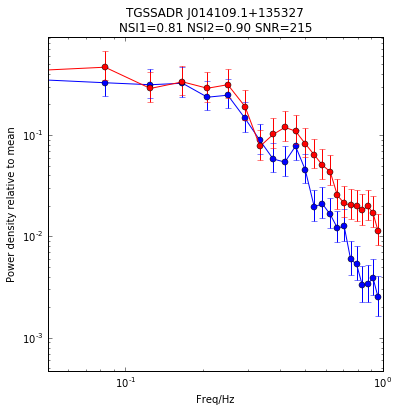

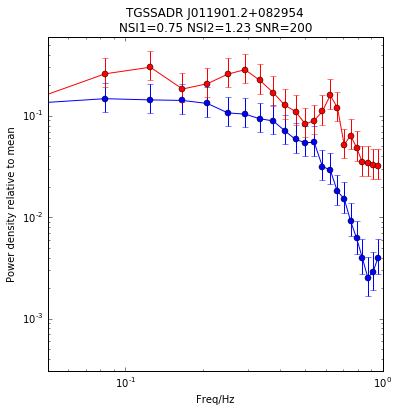

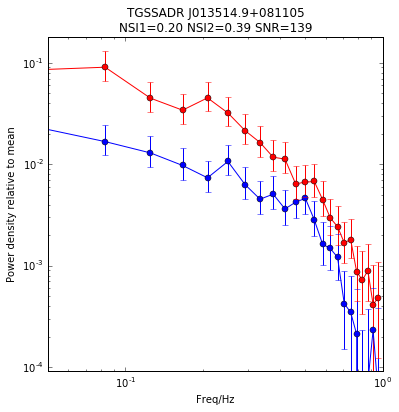

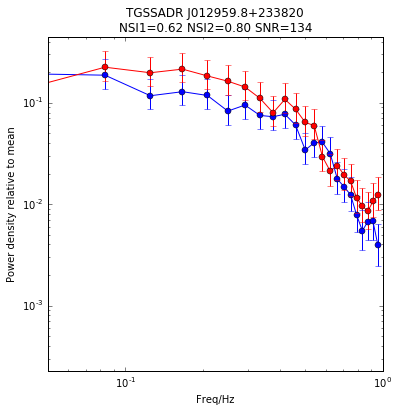

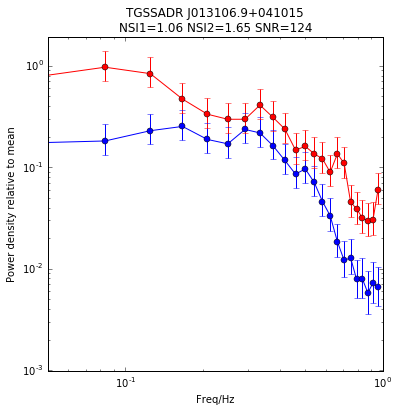

...

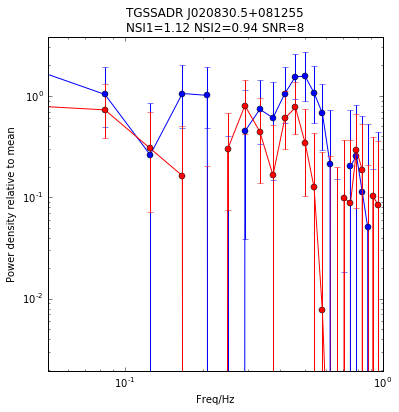

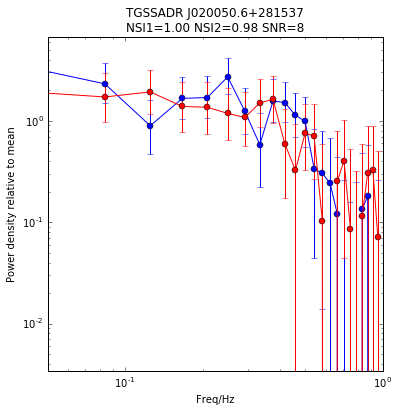

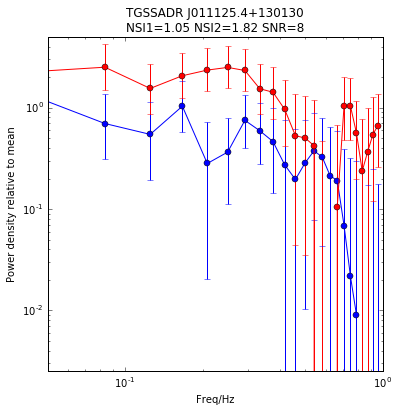

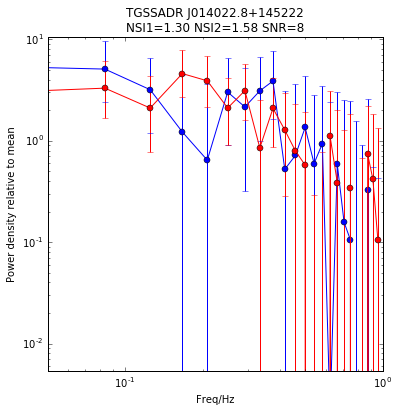

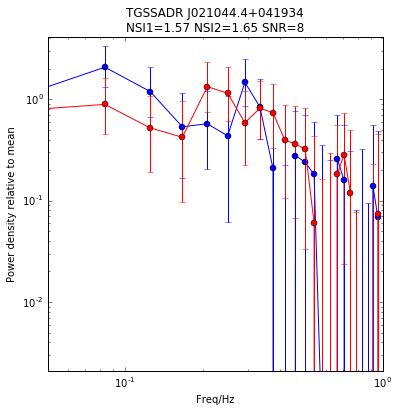

In [26]:
ts1[0][8:-7]
n=len(ts1[0][s])
FFT_WINDOW=48
n_dof = 2*(2*n//FFT_WINDOW+1)
print n_dof
print [[n_dof/chi2.ppf(0.317, n_dof)], [n_dof/chi2.ppf(0.683, n_dof)]]
print [[n_dof/chi2.ppf(0.05, n_dof)], [n_dof/chi2.ppf(0.95, n_dof)]]

for i in range(N):
    #if i%20:
    #    continue
    plt.figure(figsize=(6.0, 6.0))
    plt.xscale('log')
    plt.yscale('log')
    f, ps_on = welch(ts1[i][s]/np.mean(ts1[i][s]), fs=2., window='hanning', nperseg=FFT_WINDOW, detrend='constant')
    ps_noise = sum([welch(ts_noise1[i][j][s]/np.mean(ts1[i][s]), fs=2., window='hanning', nperseg=FFT_WINDOW, detrend='constant')[1]
                    for j in range(4)])/4.0

    p1 = ps_on[:-1]-ps_noise[:-1]
    p_err = [ps_on[:-1]*(1-n_dof/chi2.ppf(0.95, n_dof)), ps_on[:-1]*(n_dof/chi2.ppf(0.05, n_dof) - 1)]
    plt.errorbar(f[:-1], p1, yerr=p_err, fmt='o-', color='blue',)
    #plt.loglog(f[:-1], ps_noise[:-1], color='#9999FF', alpha=0.5)

    _, ps_on = welch(ts2[i][s]/np.mean(ts2[i][s]), fs=2., window='hanning', nperseg=FFT_WINDOW, detrend='constant')
    ps_noise = sum([welch(ts_noise2[i][j][s]/np.mean(ts2[i][s]), fs=2., window='hanning', nperseg=FFT_WINDOW, detrend='constant')[1]
                    for j in range(4)])/4.0

    p2 = ps_on[:-1]-ps_noise[:-1]
    p_err = [ps_on[:-1]*(1-n_dof/chi2.ppf(0.95, n_dof)), ps_on[:-1]*(n_dof/chi2.ppf(0.05, n_dof) - 1)]
    plt.errorbar(f[:-1], p2 , yerr=p_err, fmt='o-', color='red')
    #plt.loglog(f[:-1], ps_noise[:-1], color='#FF9999', alpha=0.5)
    #plt.errorbar([0.1], [1.0], yerr = [[1-n_dof/chi2.ppf(0.683, n_dof)], [n_dof/chi2.ppf(0.317, n_dof)-1]], fmt='o')
    max_p = np.max(np.stack((p1, p2)))
    #if max_p < 0:
    #    continue
    #plt.errorbar([0.1], [0.1*max_p], yerr = [[0.1*max_p*(1-n_dof/chi2.ppf(0.95, n_dof))], [0.1*max_p*(n_dof/chi2.ppf(0.05, n_dof) - 1)]], fmt='o', color='black')
    plt.xlim([0.05, 1.0])
    #plt.yscale('symlog', linthreshy=1e-3, nonposy='mask')
    plt.ylim([max_p*1e-3, 2*max_p])

    plt.title("%s\nNSI1=%.2f NSI2=%.2f SNR=%.0f" % (name[b[i]], nsi1[b[i]], nsi2[b[i]], np.hypot(snr1[b[i]], snr2[b[i]])))
    plt.xlabel("Freq/Hz")
    plt.ylabel("Power density relative to mean")
    plt.savefig("%s_subtracted.png" % name[b[i]])
    